# Import packages and data

In [1]:
#!pip install geopandas

In [2]:
#!pip install descartes

In [3]:
#!pip install plotly

In [4]:
# !pip install seaborn --upgrade

In [5]:
# !pip install dython

In [6]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import descartes
from shapely.geometry import Point, Polygon
import plotly.express as px
import datetime
from datetime import datetime
import seaborn as sns
import torch
import numpy as np
import matplotlib.pyplot as plt

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import make_grid

from dython.nominal import associations
from dython.nominal import identify_nominal_columns

In [7]:
submission_format = pd.read_csv('SubmissionFormat.csv')
training_set_values = pd.read_csv('Training_set_values.csv')
training_set_labels = pd.read_csv('Training_set_labels.csv')
tanzania_shp = gpd.read_file('stanford-yq759kh8097-geojson.json')

## Diagram of a pump 

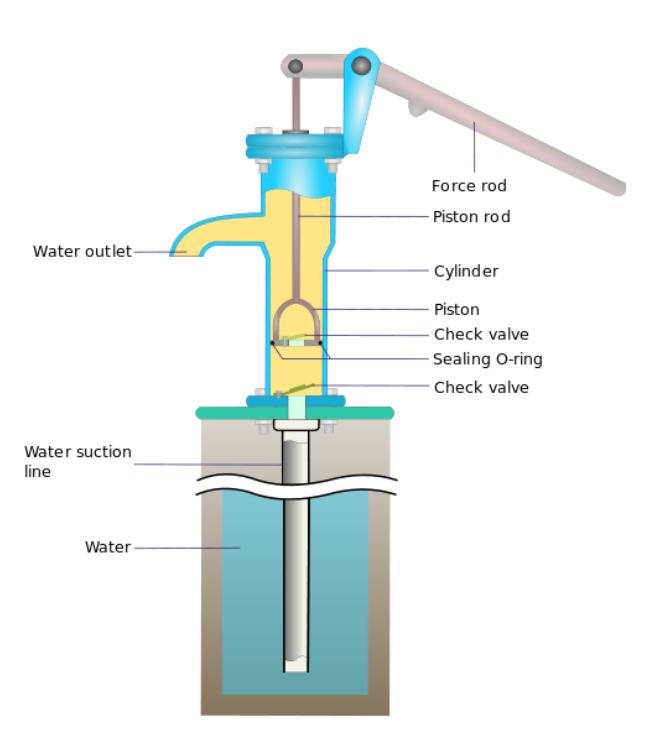

# Exploring training set

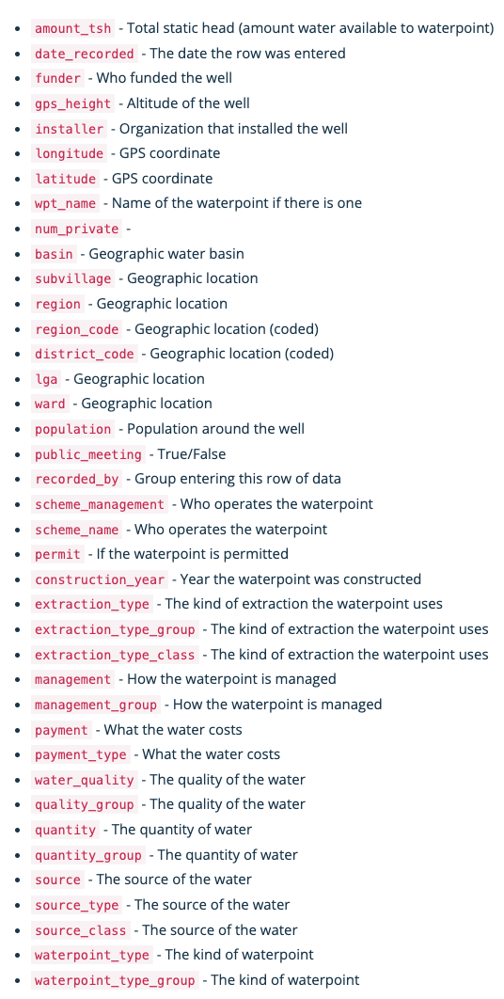

In [8]:
training_set_values.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [9]:
training_set_labels.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


In [10]:
training_set_labels.status_group.unique()

array(['functional', 'non functional', 'functional needs repair'],
      dtype=object)

In [11]:
#merging features and labels on training set
training_set_combined = pd.merge(training_set_values,training_set_labels,on='id')
training_set_combined

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,...,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,...,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


# EDA

# Map wells on Tanzania Map

In [12]:
fig1 = px.scatter_geo(training_set_combined[training_set_combined['status_group'] == 'non functional'], lat='latitude',lon='longitude',hover_name='id',color_discrete_sequence=['red'],opacity=0.5,labels='Not Functional')
fig2 = px.scatter_geo(training_set_combined[training_set_combined['status_group'] == 'functional'], lat='latitude',lon='longitude',hover_name='id',color_discrete_sequence=['green'],opacity=0.5,labels = 'Functional')
fig3 = px.scatter_geo(training_set_combined[training_set_combined['status_group'] == 'functional needs repair'], lat='latitude',lon='longitude',hover_name='id',color_discrete_sequence=['yellow'],opacity=0.5, labels = 'Functional needs repair')
fig = px.scatter_geo()
fig.add_traces(fig1._data)
fig.add_traces(fig2._data)
fig.add_traces(fig3._data)
fig.update_layout(title_text='Pumps in Tanzania', title_x=0.5, title_font_size=30,autosize=True, width=800, height=800,geo=dict(lataxis_range= [ -11.7, 0.1 ],lonaxis_range= [29, 40.4]),showlegend=True, dragmode = False)
fig.show()

## We can see that functional, non functional and functional but needs repair pumps are scattered around the country, therefore we can now assume that location of the pump does not affect its functionality.

In [13]:
training_set_combined.status_group.unique()

array(['functional', 'non functional', 'functional needs repair'],
      dtype=object)

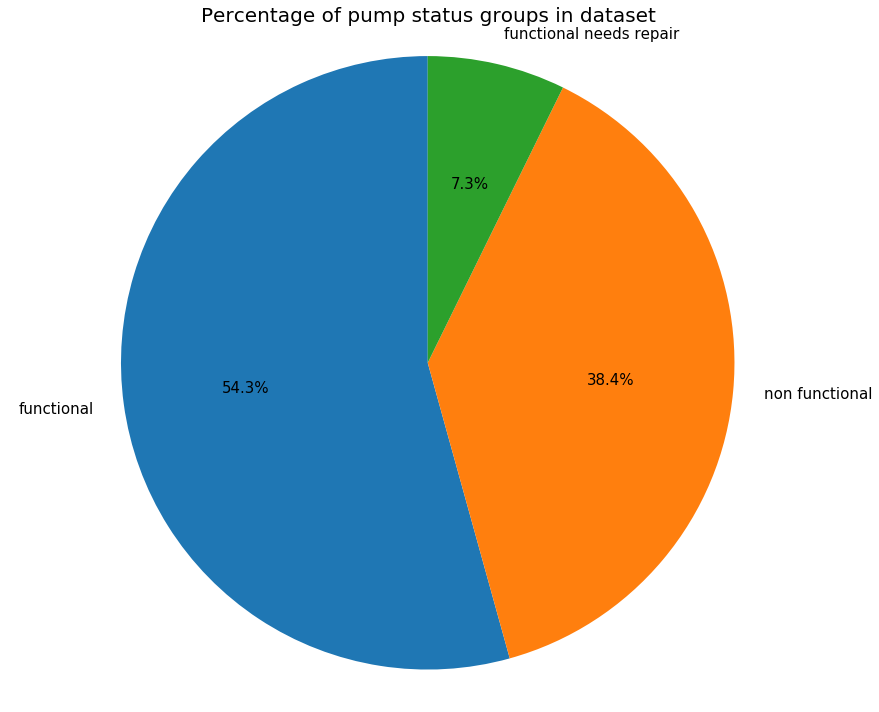

In [14]:
status_group_counts = training_set_combined['status_group'].value_counts()
#make pie chart of status groups
plt.figure(figsize=(12,10))
status_group_counts.plot.pie(y=status_group_counts.index,
shadow=False,
startangle=90,
radius = 10,
autopct='%1.1f%%',
fontsize=15)

plt.title('Percentage of pump status groups in dataset', fontsize= 20)
plt.ylabel("")
plt.axis('equal')
plt.tight_layout()
plt.show()

## Age of pump 

In [15]:
#age of pump, assuming age recorded is the day the pump was installed
def age(str_first_day):
    age = datetime.today() - datetime.strptime(str_first_day, '%Y-%m-%d') 
    return age.days

#get day, month and year of date_recorded
def get_day(str_date):
    datee = datetime.strptime(str_date, '%Y-%m-%d')
    day = datee.day
    return day

def get_month(str_date):
    datee = datetime.strptime(str_date, '%Y-%m-%d')
    month = datee.month
    return month

def get_year(str_date):
    datee = datetime.strptime(str_date, '%Y-%m-%d')
    year = datee.year
    return year

In [16]:
training_set_combined['recorded_day'] = training_set_combined['date_recorded'].apply(get_day)
training_set_combined['recorded_month'] = training_set_combined['date_recorded'].apply(get_month)
training_set_combined['recorded_year'] = training_set_combined['date_recorded'].apply(get_year)
training_set_combined.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,recorded_day,recorded_month,recorded_year
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,14,3,2011
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,6,3,2013
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,25,2,2013
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,28,1,2013
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,13,7,2011


In [17]:
#get number of wells where construction year is 0
len(training_set_combined[training_set_combined['construction_year'] == 0])

20709

In [18]:
len(training_set_combined[training_set_combined['construction_year'] != 0])

38691

## 1 third of the dataset doesn't have a year for when the well was built 

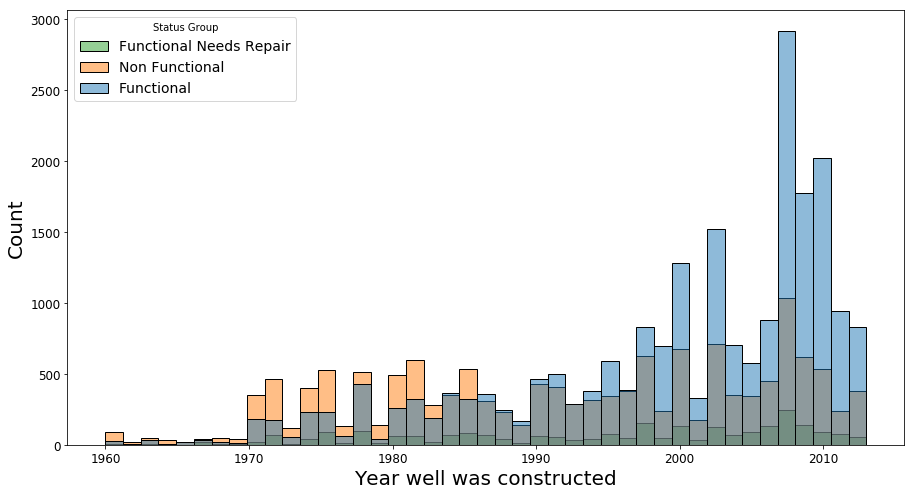

In [19]:
#trying same technique with construction year
#plot distribution of pump ages for three cases
plt.figure(figsize=(15,8))
ax = sns.histplot(data=training_set_combined[training_set_combined['construction_year']>1800], hue= 'status_group', x = 'construction_year')
ax.set_xlabel('Year well was constructed',fontsize = 20)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_ylabel('Count',fontsize = 20)
plt.legend(title='Status Group', loc='upper left', labels=['Functional Needs Repair', 'Non Functional','Functional'], fontsize = 14)
plt.show()

## For the wells that do have a year of construction not equal to 0, we can see that there are more non-functional wells that functional wells any year before 1985

## Population around pump 

In [20]:
len(training_set_combined[training_set_combined['population'] == 0])

21381

In [21]:
len(training_set_combined[training_set_combined['population'] != 0])

38019

In [22]:
21831/(21381+38019)

0.36752525252525253

## 1 third of the pumps in the dataset have a population around well = 0 

In [23]:
print('Max Population: '+str(max(training_set_combined.population))+'\nMin Population: '+str(min(training_set_combined.population))+'\nAverage Population: '+str(training_set_combined.population.mean()))

Max Population: 30500
Min Population: 0
Average Population: 179.90998316498317


In [24]:
# For wells with population above 0
print('Max Population: '+str(max(training_set_combined[training_set_combined['population']>0].population))+'\nMin Population: '+str(min(training_set_combined[training_set_combined['population']>0].population))+'\nAverage Population: '+str(training_set_combined[training_set_combined['population']>0].population.mean()))

Max Population: 30500
Min Population: 1
Average Population: 281.08716694284436


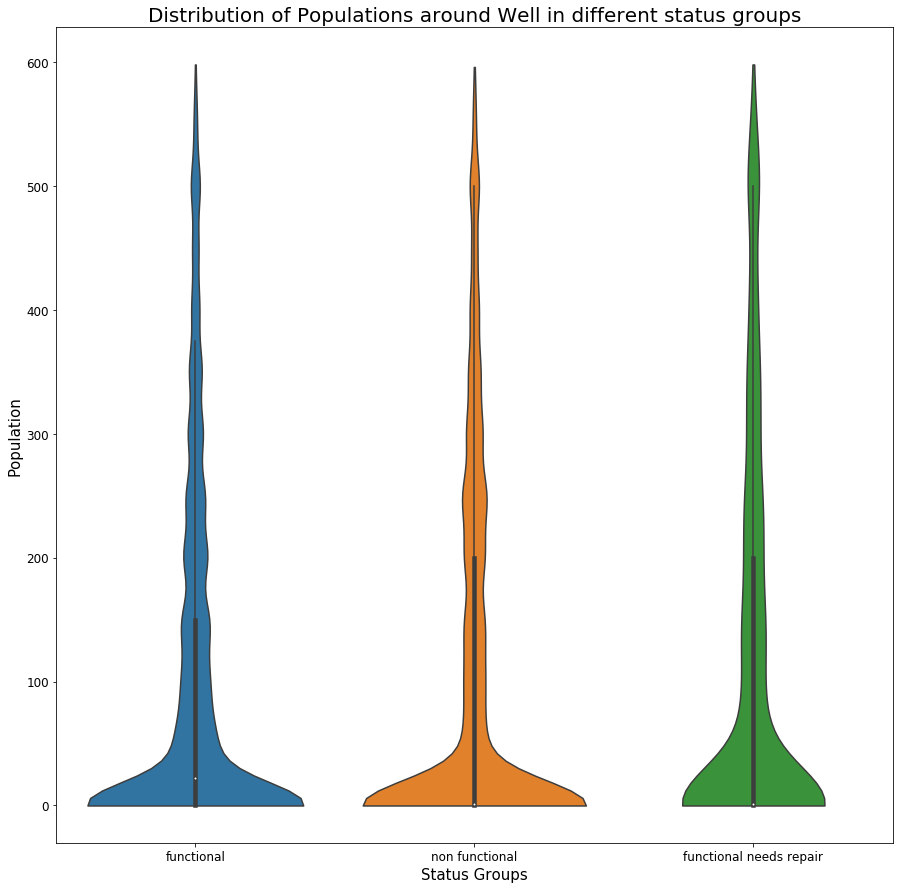

In [25]:
plt.figure(figsize=(15,15))
ax = sns.violinplot(x='status_group', y='population', data=training_set_combined[training_set_combined['population']<600], cut = 0)
plt.title('Distribution of Populations around Well in different status groups', fontsize = 20)
ax.set_ylabel('Population',fontsize = 15)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel('Status Groups',fontsize = 15)
plt.show()

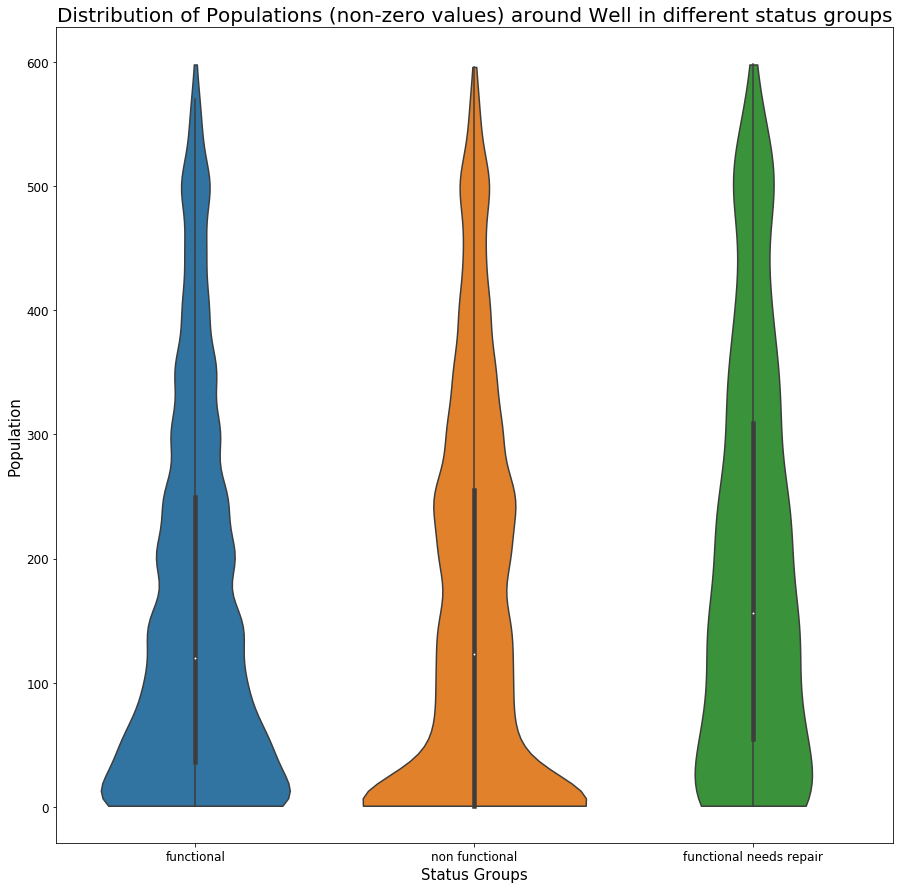

In [26]:
plt.figure(figsize=(15,15))
ax = sns.violinplot(x='status_group', y='population', data=training_set_combined[(training_set_combined['population']!= 0) & (training_set_combined['population'] < 600)], cut = 0)
plt.title('Distribution of Populations (non-zero values) around Well in different status groups', fontsize = 20)
ax.set_ylabel('Population',fontsize = 15)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel('Status Groups',fontsize = 15)
plt.show()

## Similar distribution. smoother for functional needs repair category

## altitude of well

In [27]:
print('Max Altitude of Well: '+str(max(training_set_combined.gps_height))+'\nMin Altitude of Well: '+str(min(training_set_combined.gps_height))+'\nAverage Altitude of Well: '+str(training_set_combined.gps_height.mean()))

Max Altitude of Well: 2770
Min Altitude of Well: -90
Average Altitude of Well: 668.297239057239


Text(0.5,0,'Status Groups')

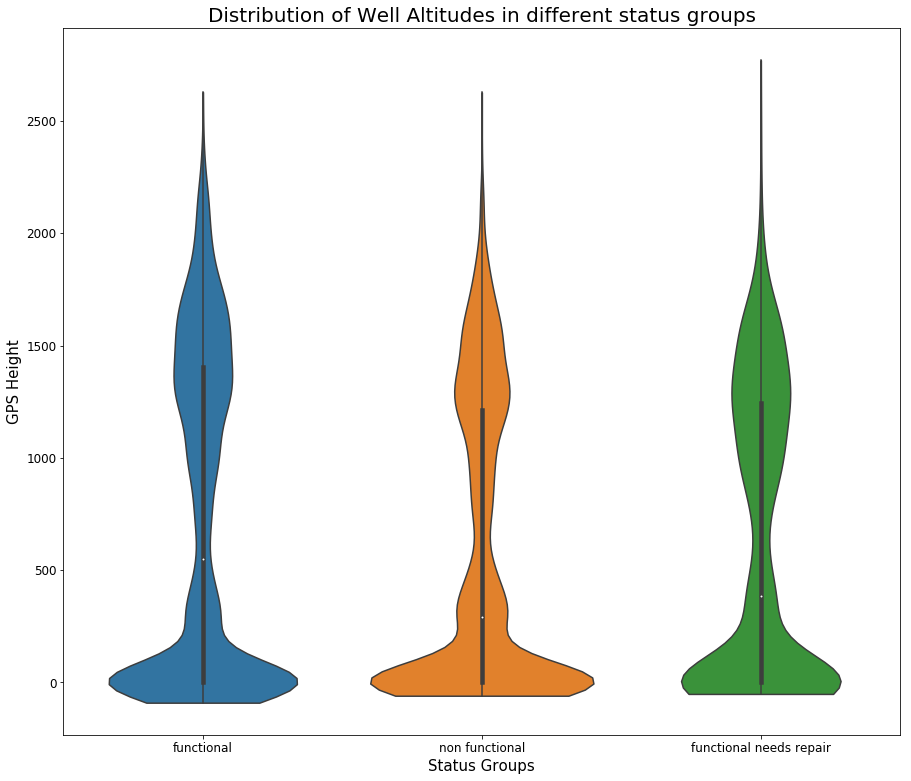

In [28]:
plt.figure(figsize=(15,13))
ax = sns.violinplot(x='status_group', y='gps_height', data=training_set_combined, cut = 0)
plt.title('Distribution of Well Altitudes in different status groups', fontsize = 20)
ax.set_ylabel('GPS Height',fontsize = 15)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel('Status Groups',fontsize = 15)

Text(0,0.5,'Count')

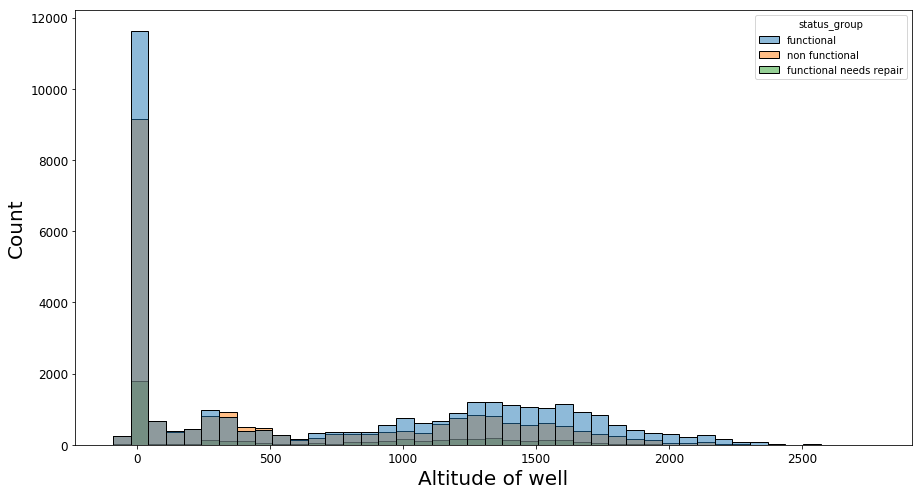

In [29]:
#plot distribution of pump ages for three cases
plt.figure(figsize=(15,8))
ax = sns.histplot(data=training_set_combined, hue= 'status_group', x = 'gps_height')
ax.set_xlabel('Altitude of well',fontsize = 20)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_ylabel('Count',fontsize = 20)

## Extraction Type 

In [30]:
training_set_combined.extraction_type.unique()

array(['gravity', 'submersible', 'swn 80', 'nira/tanira', 'india mark ii',
       'other', 'ksb', 'mono', 'windmill', 'afridev', 'other - rope pump',
       'india mark iii', 'other - swn 81', 'other - play pump', 'cemo',
       'climax', 'walimi', 'other - mkulima/shinyanga'], dtype=object)

In [31]:
def pivot_count(original_df,group):
    # get count by group and status
    df2 = original_df[[str(group), 'status_group','id']].groupby([str(group), 'status_group']).count().reset_index().rename(columns={'id':'count'})
    # get count_total by group
    df_group_total = original_df[[str(group),'id']].groupby([str(group)]).count().reset_index().rename(columns={'id':'count_total'})
    #sort total df in descending order of count
    df_group_total = df_group_total.sort_values(by = 'count_total', ascending = False)
    df_group_pct = pd.merge(df2,df_group_total,on = str(group), how = 'outer')
    df_group_pct['pct_count'] = round(100* df_group_pct['count'] / df_group_pct['count_total'],1)
    df_group_type_pivot = df_group_pct.pivot(index=str(group), columns='status_group', values='pct_count').fillna(0).reset_index()
    return df_group_total, df_group_type_pivot

In [32]:
df_extraction_type_total, df_extraction_type_pivot = pivot_count(training_set_combined,'extraction_type')

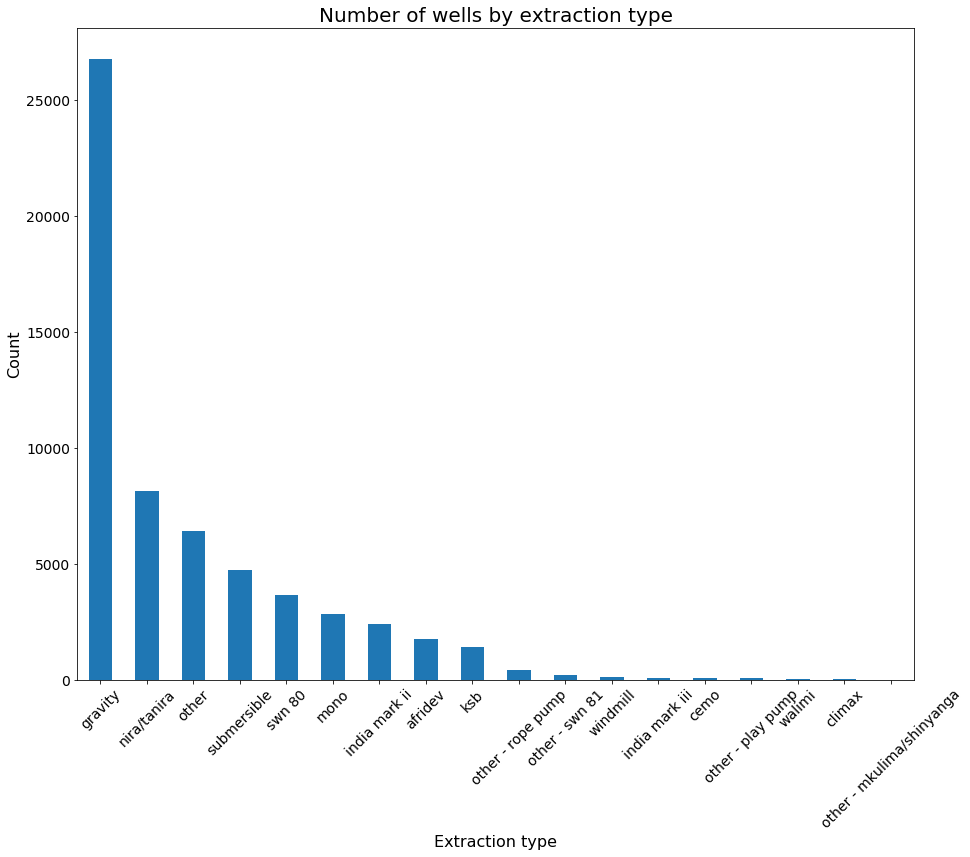

In [33]:
# plot data in stack manner of bar type
plt.rcParams["figure.figsize"] = [15, 12]
df_extraction_type_total.plot(x = 'extraction_type', y = 'count_total', kind = 'bar', legend= False)
plt.xlabel("Extraction type", size = 16)
plt.ylabel("Count", size = 16)
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Number of wells by extraction type', size = 20)
plt.show()

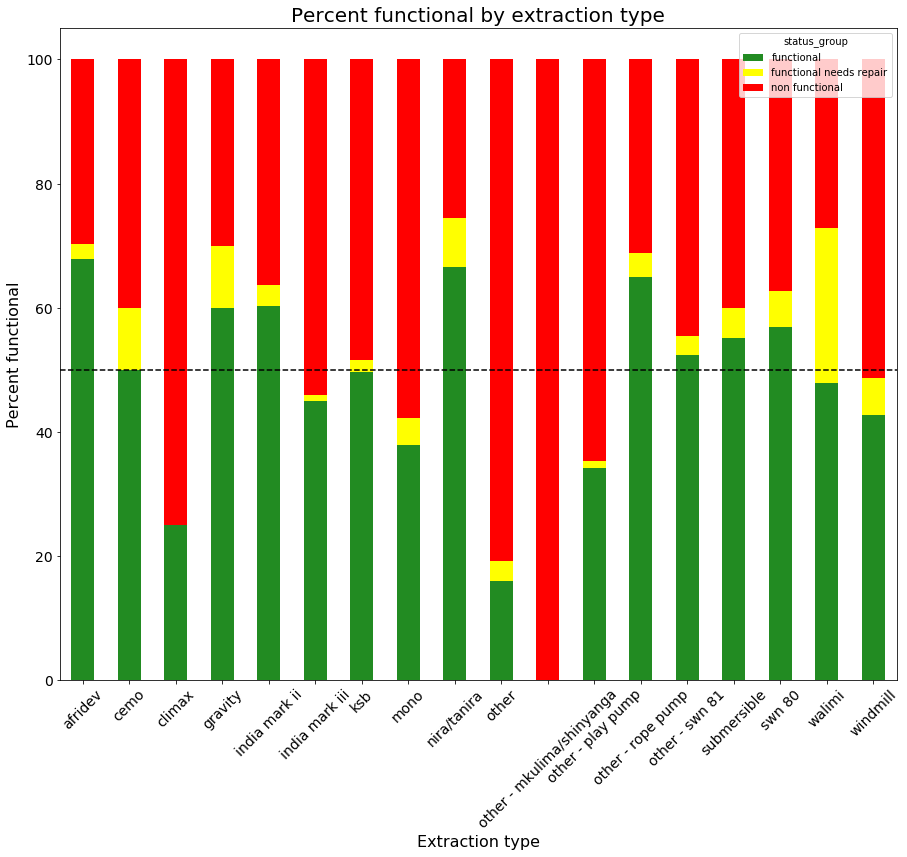

In [34]:
# plot data in stack manner of bar type
plt.rcParams["figure.figsize"] = [15, 12]
# plt.figure(figsize=(15,8)) 
df_extraction_type_pivot.plot(x='extraction_type', kind='bar', stacked=True, color = ['forestgreen','yellow','red'])
plt.xlabel("Extraction type", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.axhline(y=50, color='black', linestyle='--')
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Percent functional by extraction type', size = 20)
plt.show()

## We can see that "windmill", "other - play pump", "other - mkulima/shinyanga, "other", "mono", "india mark iii" and "climax" extraction types have a majority of non functional pumps 

## Source type 

In [35]:
training_set_combined.source.unique()

array(['spring', 'rainwater harvesting', 'dam', 'machine dbh', 'other',
       'shallow well', 'river', 'hand dtw', 'lake', 'unknown'],
      dtype=object)

In [36]:
df_source_total, df_source_pivot = pivot_count(training_set_combined, 'source')

In [37]:
df_source_total

,source,count_total
8,spring,17021
7,shallow well,16824
3,machine dbh,11075
6,river,9612
5,rainwater harvesting,2295
1,hand dtw,874
2,lake,765
0,dam,656
4,other,212
9,unknown,66


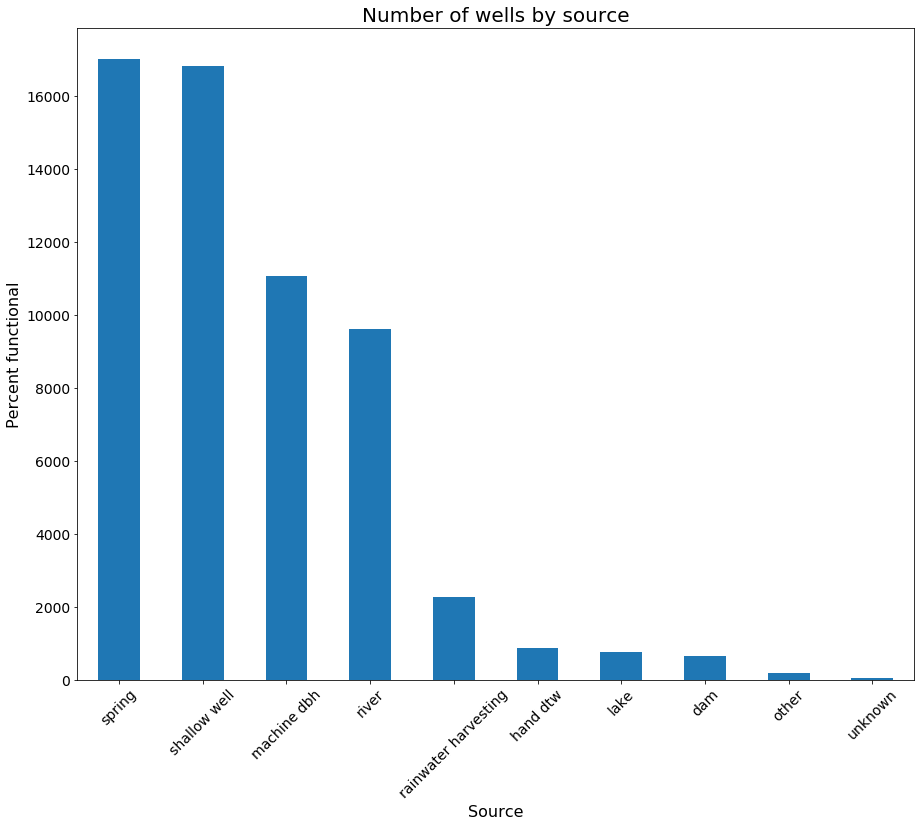

In [38]:
df_source_total.plot(x = 'source', y = 'count_total', kind = 'bar', legend = False)
plt.xlabel("Source", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Number of wells by source', size = 20)
plt.show()

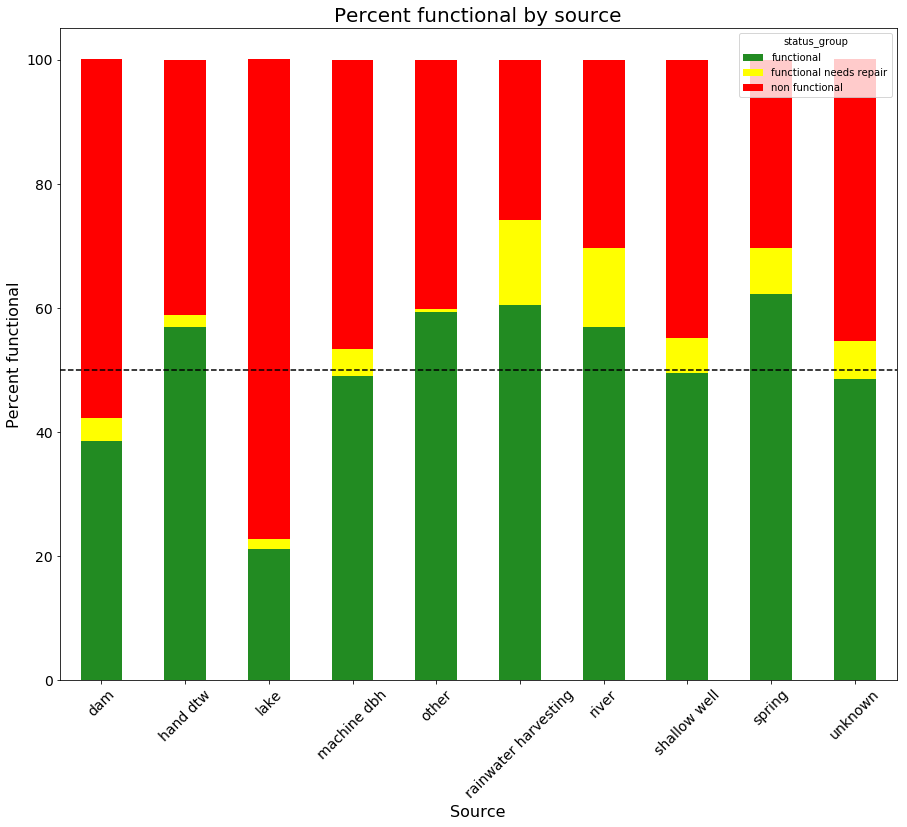

In [39]:
# plot data in stack manner of bar type
plt.rcParams["figure.figsize"] = [15, 12]
# plt.figure(figsize=(15,8)) 
df_source_pivot.plot(x='source', kind='bar', stacked=True, color = ['forestgreen','yellow','red'])
plt.xlabel("Source", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.axhline(y=50, color='black', linestyle='--')
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Percent functional by source', size = 20)
plt.show()

## We can see that "dam" and "lake" source have a majority of non functional pumps 

## Waterpoint type 

In [40]:
df_waterpoint_type_total, df_waterpoint_type_pivot = pivot_count(training_set_combined, 'waterpoint_type')

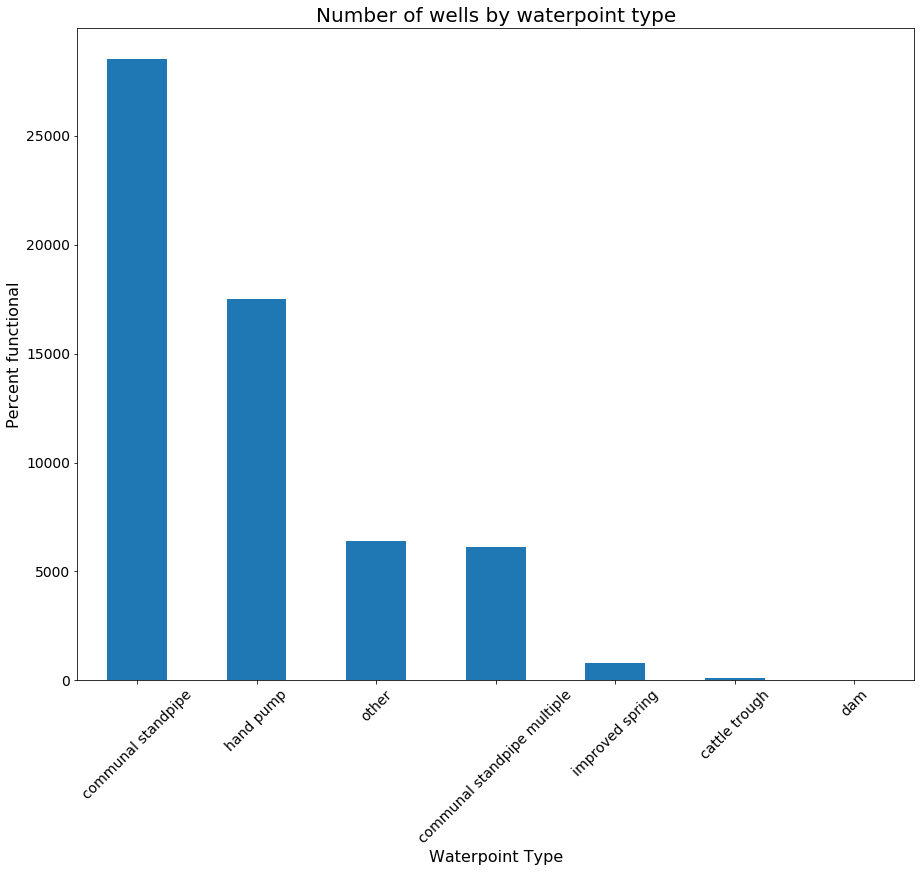

In [41]:
df_waterpoint_type_total.plot(x = 'waterpoint_type', y = 'count_total', kind = 'bar', legend = False)
plt.xlabel("Waterpoint Type", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Number of wells by waterpoint type', size = 20)
plt.show()

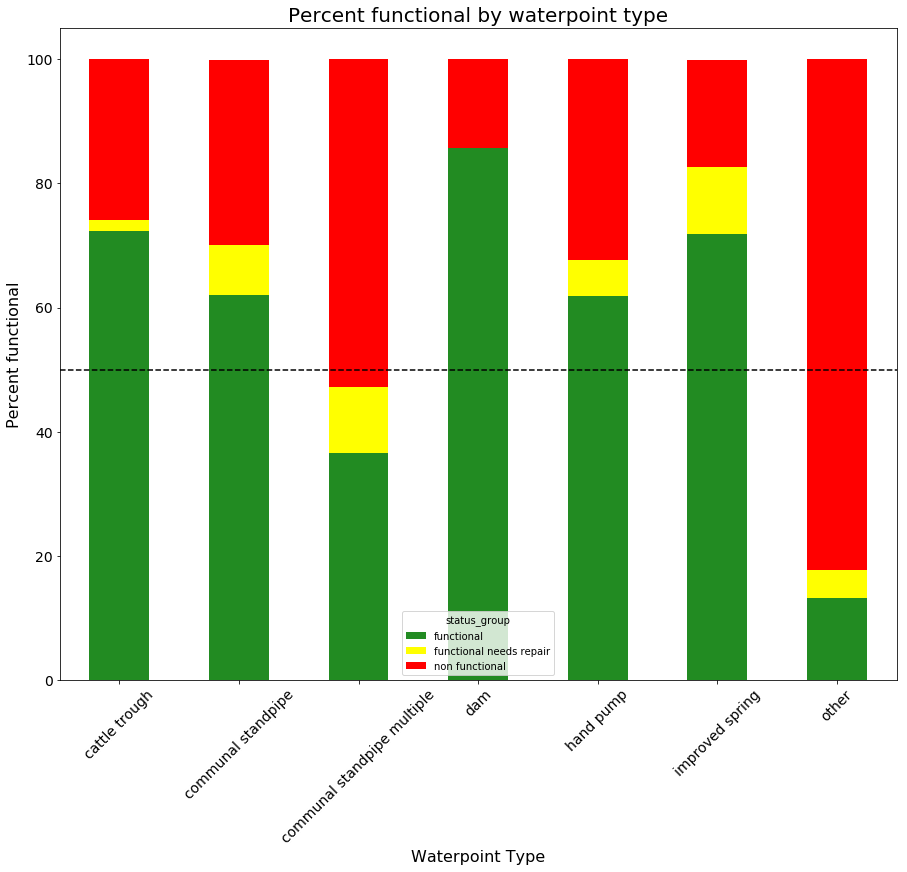

In [42]:
# plot data in stack manner of bar type
plt.rcParams["figure.figsize"] = [15, 12]
# plt.figure(figsize=(15,8)) 
df_waterpoint_type_pivot.plot(x='waterpoint_type', kind='bar', stacked=True, color = ['forestgreen','yellow','red'])
plt.xlabel("Waterpoint Type", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.axhline(y=50, color='black', linestyle='--')
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Percent functional by waterpoint type', size = 20)
plt.show()

## We can see that "communal standpipe multiple" and "other" waterpoint types have a majority of non functional pumps 

## Scheme Management 

In [43]:
training_set_combined[['scheme_management','scheme_name','status_group']]

,scheme_management,scheme_name,status_group
0,VWC,Roman,functional
1,Other,NaN,functional
2,VWC,Nyumba ya mungu pipe scheme,functional
3,VWC,NaN,non functional
4,NaN,NaN,functional
...,...,...,...
59395,Water Board,Losaa Kia water supply,functional
59396,VWC,Ikondo electrical water sch,functional
59397,VWC,NaN,functional
59398,VWC,NaN,functional


In [44]:
training_set_combined.scheme_management.unique()

array(['VWC', 'Other', nan, 'Private operator', 'WUG', 'Water Board',
       'WUA', 'Water authority', 'Company', 'Parastatal', 'Trust', 'SWC',
       'None'], dtype=object)

In [45]:
training_set_combined.isnull().sum().sum()

46094

In [46]:
df_scheme_management_total, df_scheme_management_pivot = pivot_count(training_set_combined, 'scheme_management')

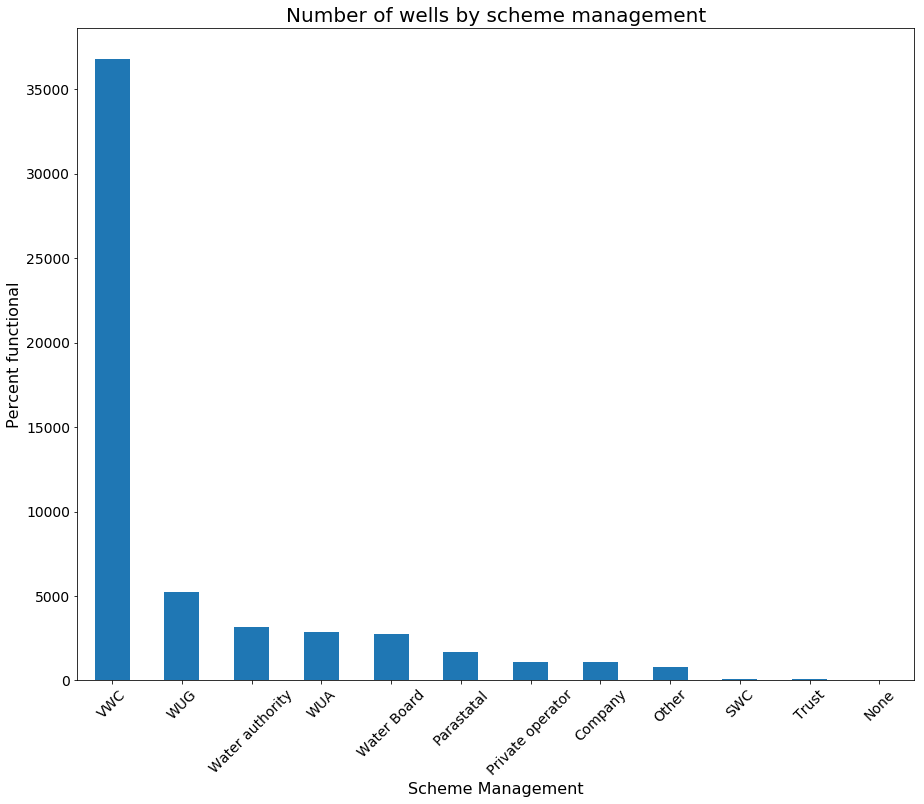

In [47]:
df_scheme_management_total.plot(x = 'scheme_management', y = 'count_total', kind = 'bar', legend = False)
plt.xlabel("Scheme Management", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Number of wells by scheme management', size = 20)
plt.show()

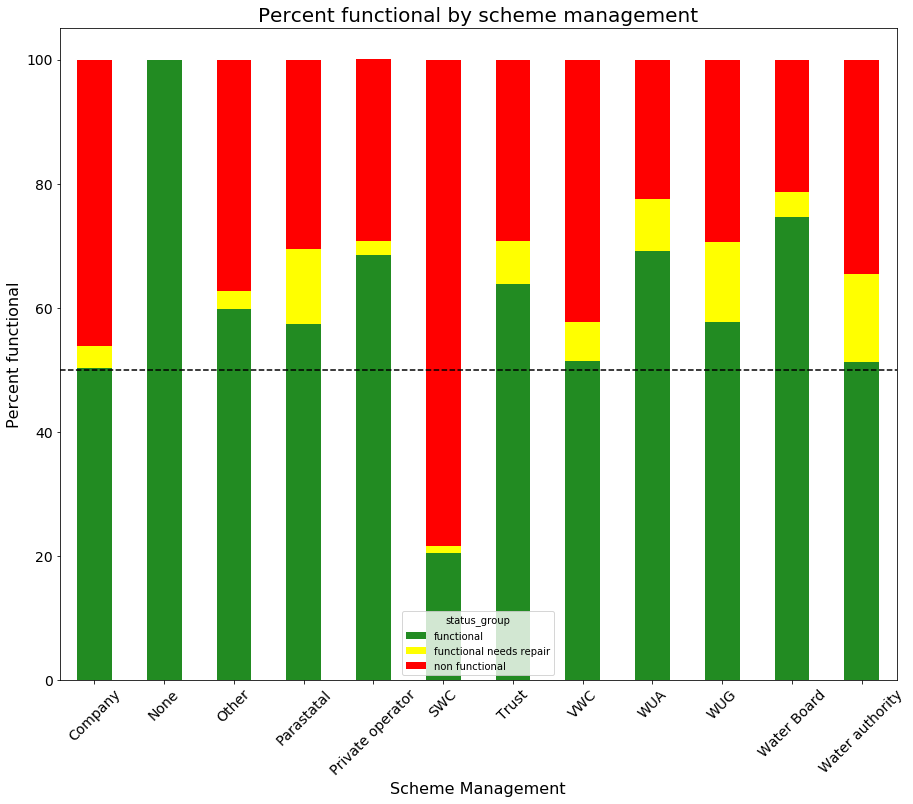

In [48]:
# plot data in stack manner of bar type
plt.rcParams["figure.figsize"] = [15, 12]
# plt.figure(figsize=(15,8)) 
df_scheme_management_pivot.plot(x='scheme_management', kind='bar', stacked=True, color = ['forestgreen','yellow','red'])
plt.xlabel("Scheme Management", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.axhline(y=50, color='black', linestyle='--')
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Percent functional by scheme management', size = 20)
plt.show()

## We can see that "SWC" scheme management has a majority of non functional pumps 

# Quantity

In [49]:
training_set_combined[['quantity','status_group']]

,quantity,status_group
0,enough,functional
1,insufficient,functional
2,enough,functional
3,dry,non functional
4,seasonal,functional
...,...,...
59395,enough,functional
59396,enough,functional
59397,enough,functional
59398,insufficient,functional


In [50]:
df_quantity_total, df_quantity_pivot = pivot_count(training_set_combined, 'quantity')

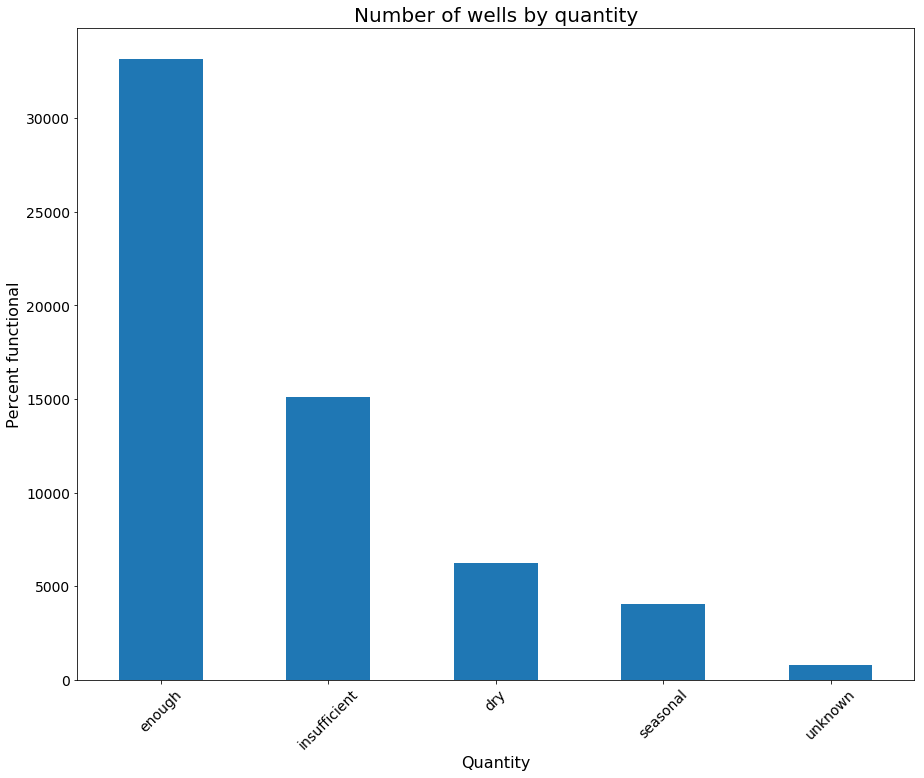

In [51]:
df_quantity_total.plot(x = 'quantity', y = 'count_total', kind = 'bar', legend = False)
plt.xlabel("Quantity", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Number of wells by quantity', size = 20)
plt.show()

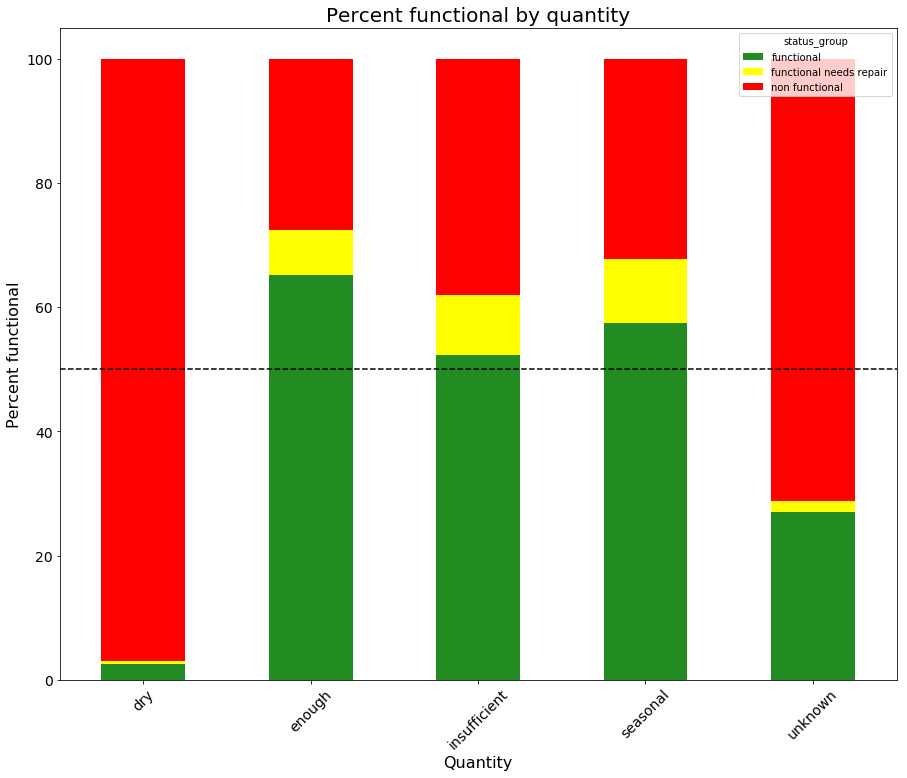

In [52]:
# plot data in stack manner of bar type
plt.rcParams["figure.figsize"] = [15, 12]
# plt.figure(figsize=(15,8)) 
df_quantity_pivot.plot(x='quantity', kind='bar', stacked=True, color = ['forestgreen','yellow','red'])
plt.xlabel("Quantity", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.axhline(y=50, color='black', linestyle='--')
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Percent functional by quantity', size = 20)
plt.show()

## We can see that "dry" and "unknown" quantities have a majority of non functional pumps 

## Quality

In [53]:
df_water_quality_total, df_water_quality_pivot = pivot_count(training_set_combined, 'water_quality')

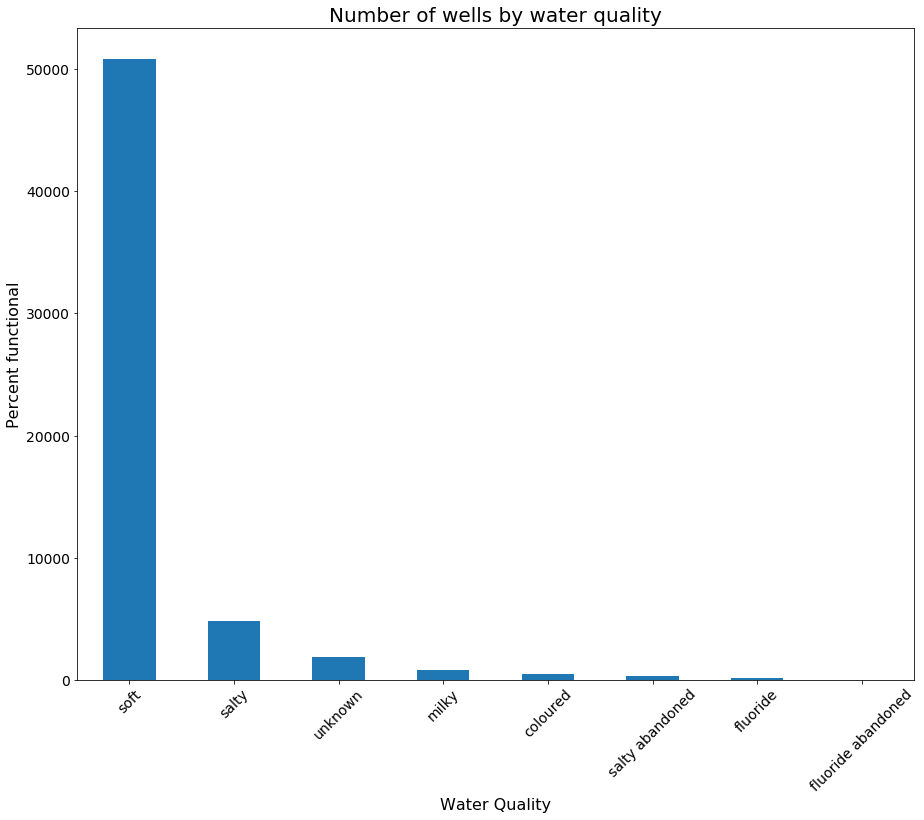

In [54]:
df_water_quality_total.plot(x = 'water_quality', y = 'count_total', kind = 'bar', legend = False)
plt.xlabel("Water Quality", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Number of wells by water quality', size = 20)
plt.show()

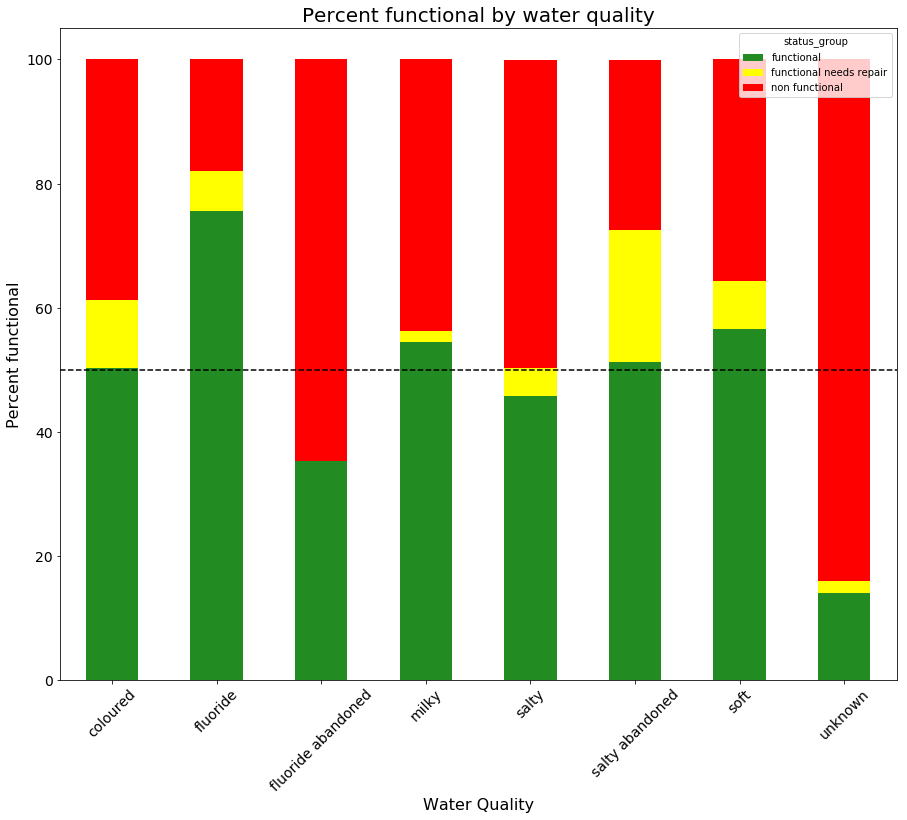

In [55]:
# plot data in stack manner of bar type
plt.rcParams["figure.figsize"] = [15, 12]
# plt.figure(figsize=(15,8)) 
df_water_quality_pivot.plot(x='water_quality', kind='bar', stacked=True, color = ['forestgreen','yellow','red'])
plt.xlabel("Water Quality", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.axhline(y=50, color='black', linestyle='--')
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Percent functional by water quality', size = 20)
plt.show()

## Payment type 

In [56]:
training_set_combined[['payment','payment_type','status_group']]

,payment,payment_type,status_group
0,pay annually,annually,functional
1,never pay,never pay,functional
2,pay per bucket,per bucket,functional
3,never pay,never pay,non functional
4,never pay,never pay,functional
...,...,...,...
59395,pay per bucket,per bucket,functional
59396,pay annually,annually,functional
59397,pay monthly,monthly,functional
59398,never pay,never pay,functional


## only keep payment_type 

In [57]:
df_payment_type_total, df_payment_type_pivot = pivot_count(training_set_combined, 'payment_type')

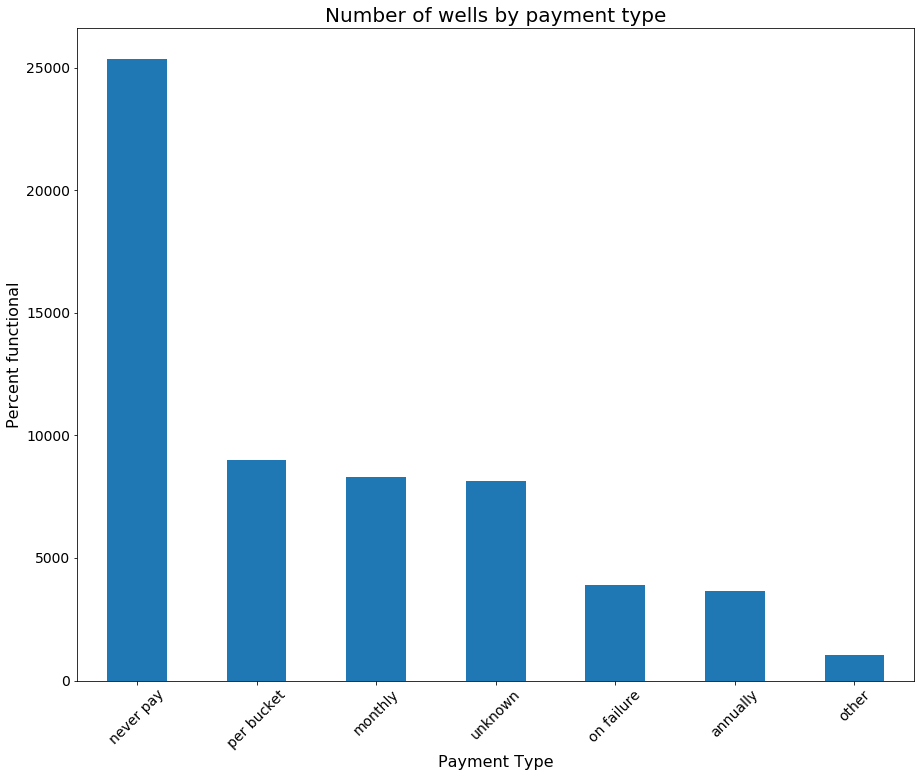

In [58]:
df_payment_type_total.plot(x = 'payment_type', y = 'count_total', kind = 'bar', legend = False)
plt.xlabel("Payment Type", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Number of wells by payment type', size = 20)
plt.show()

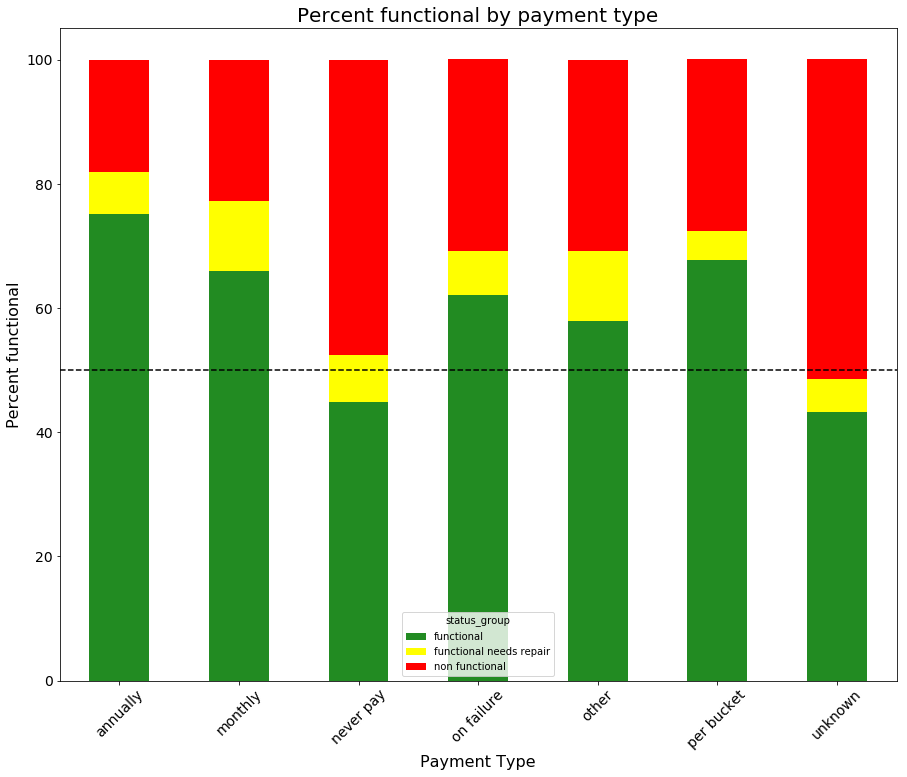

In [59]:
# plot data in stack manner of bar type
plt.rcParams["figure.figsize"] = [15, 12]
# plt.figure(figsize=(15,8)) 
df_payment_type_pivot.plot(x='payment_type', kind='bar', stacked=True, color = ['forestgreen','yellow','red'])
plt.xlabel("Payment Type", size = 16)
plt.ylabel("Percent functional", size = 16)
plt.axhline(y=50, color='black', linestyle='--')
plt.xticks(size = 14, rotation = 45)
plt.yticks(size = 14)
plt.title('Percent functional by payment type', size = 20)
plt.show()

## We can see that "never pay" and "unknown" quantities have a majority of non functional pumps 

In [60]:
#get % of Nans in each column
def Nan_pct(dframe,column_name):
    nan_pct = dframe[column_name].isna().sum()/len(dframe[str(column_name)])
    return nan_pct

In [61]:
percent_nans = []
for i in list(training_set_combined.columns):
    percent_nans.append(Nan_pct(training_set_combined,i))

In [62]:
#drop redundant columns
training_set_combined = training_set_combined.drop(columns = ['recorded_by','funder','installer','lga','scheme_name','subvillage','ward','wpt_name','source_type','source_class','quantity_group','extraction_type_group','quality_group','management_group','payment_type','waterpoint_type_group','district_code','region_code','region','basin','extraction_type','date_recorded','scheme_management'])
training_set_combined.head()

,id,amount_tsh,gps_height,longitude,latitude,num_private,population,public_meeting,permit,construction_year,...,management,payment,water_quality,quantity,source,waterpoint_type,status_group,recorded_day,recorded_month,recorded_year
0,69572,6000.0,1390,34.938093,-9.856322,0,109,True,False,1999,...,vwc,pay annually,soft,enough,spring,communal standpipe,functional,14,3,2011
1,8776,0.0,1399,34.698766,-2.147466,0,280,NaN,True,2010,...,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional,6,3,2013
2,34310,25.0,686,37.460664,-3.821329,0,250,True,True,2009,...,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional,25,2,2013
3,67743,0.0,263,38.486161,-11.155298,0,58,True,True,1986,...,vwc,never pay,soft,dry,machine dbh,communal standpipe multiple,non functional,28,1,2013
4,19728,0.0,0,31.130847,-1.825359,0,0,True,True,0,...,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,functional,13,7,2011


# Understand correlation between variables using dython library

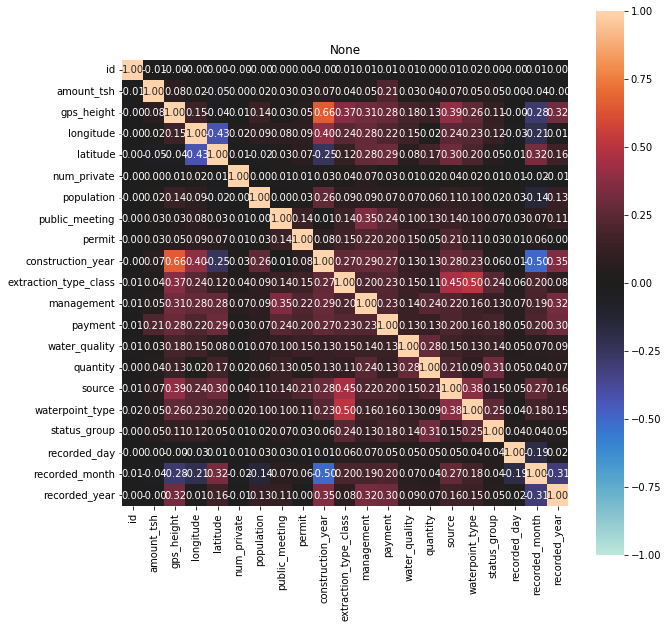

In [63]:
complete_correlation = associations(training_set_combined, filename= 'complete_correlation.png', figsize=(10,10))

In [64]:
#checking correlation between categorical values that are NOT labels
categorical_features=identify_nominal_columns(training_set_combined.drop(columns = 'status_group'))
categorical_features

['public_meeting',
 'permit',
 'extraction_type_class',
 'management',
 'payment',
 'water_quality',
 'quantity',
 'source',
 'waterpoint_type']

In [65]:
#one-hot encode categorical variables
one_hot_df = pd.get_dummies(training_set_combined.drop(columns = ['status_group']), columns = categorical_features)
one_hot_df.columns

Index(['id', 'amount_tsh', 'gps_height', 'longitude', 'latitude',
       'num_private', 'population', 'construction_year', 'recorded_day',
       'recorded_month', 'recorded_year', 'public_meeting_False',
       'public_meeting_True', 'permit_False', 'permit_True',
       'extraction_type_class_gravity', 'extraction_type_class_handpump',
       'extraction_type_class_motorpump', 'extraction_type_class_other',
       'extraction_type_class_rope pump', 'extraction_type_class_submersible',
       'extraction_type_class_wind-powered', 'management_company',
       'management_other', 'management_other - school',
       'management_parastatal', 'management_private operator',
       'management_trust', 'management_unknown', 'management_vwc',
       'management_water authority', 'management_water board',
       'management_wua', 'management_wug', 'payment_never pay',
       'payment_other', 'payment_pay annually', 'payment_pay monthly',
       'payment_pay per bucket', 'payment_pay when scheme

In [66]:
one_hot_df.shape

(59400, 71)

In [67]:
training_set_combined_clean = pd.merge(training_set_labels,one_hot_df, on = 'id')
training_set_combined_clean.head()

,id,status_group,amount_tsh,gps_height,longitude,latitude,num_private,population,construction_year,recorded_day,...,source_shallow well,source_spring,source_unknown,waterpoint_type_cattle trough,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_dam,waterpoint_type_hand pump,waterpoint_type_improved spring,waterpoint_type_other
0,69572,functional,6000.0,1390,34.938093,-9.856322,0,109,1999,14,...,0,1,0,0,1,0,0,0,0,0
1,8776,functional,0.0,1399,34.698766,-2.147466,0,280,2010,6,...,0,0,0,0,1,0,0,0,0,0
2,34310,functional,25.0,686,37.460664,-3.821329,0,250,2009,25,...,0,0,0,0,0,1,0,0,0,0
3,67743,non functional,0.0,263,38.486161,-11.155298,0,58,1986,28,...,0,0,0,0,0,1,0,0,0,0
4,19728,functional,0.0,0,31.130847,-1.825359,0,0,0,13,...,0,0,0,0,1,0,0,0,0,0


In [68]:
training_set_combined_clean.shape

(59400, 72)

In [69]:
#get csv
training_set_combined_clean.to_csv('training_set_clean.csv', index=False)